# IoT Weather Monitoring System - Complete Time Series Analysis
## Temperature, Humidity, Pressure & Dew Point Forecasting
### Date: 26-11-2025 | Location: Gurugram, Haryana

---

This notebook contains the complete analysis including:
- Data loading and statistical description
- Data preprocessing for time series
- Model training (ARIMA, SARIMA, GARCH)
- Performance evaluation
- Future forecasting (2:15 PM - 6:15 PM)
- Comprehensive visualizations

## Step 1: Import Libraries

In [1]:
# Run this cell to import all required libraries
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from arch import arch_model
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')

print('✓ All libraries imported successfully!')

✓ All libraries imported successfully!


## Step 2: Load Data

In [2]:
# Load the sensor data
df = pd.read_excel('iot_sensor_readings.xlsx')
print(f'Dataset Shape: {df.shape}')
print(f'\nColumns: {list(df.columns)}')
df.head(10)

Dataset Shape: (300, 6)

Columns: ['Date', 'Time', 'Temperature (°C)', 'Humidity (%)', 'Pressure (hPa)', 'Dew Point (°C)']


,Date,Time,Temperature (°C),Humidity (%),Pressure (hPa),Dew Point (°C)
0,26-11-2025,09:00:00 AM,15.9,59.8,1018.6,8.1
1,26-11-2025,09:01:00 AM,15.8,56.6,1018.3,7.3
2,26-11-2025,09:02:00 AM,16.1,58.7,1018.3,8.1
3,26-11-2025,09:03:00 AM,16.3,56.6,1018.4,7.6
4,26-11-2025,09:04:00 AM,16.0,57.8,1018.5,7.6
5,26-11-2025,09:05:00 AM,16.2,56.2,1018.4,7.4
6,26-11-2025,09:06:00 AM,16.1,58.7,1018.4,8.0
7,26-11-2025,09:07:00 AM,16.3,55.7,1018.5,7.4
8,26-11-2025,09:08:00 AM,16.0,59.2,1018.7,8.1
9,26-11-2025,09:09:00 AM,16.1,55.8,1018.6,7.3


In [3]:
# Display last 10 rows
df.tail(10)

,Date,Time,Temperature (°C),Humidity (%),Pressure (hPa),Dew Point (°C)
290,26-11-2025,01:50:00 PM,22.4,41.2,1018.0,8.6
291,26-11-2025,01:51:00 PM,21.9,44.0,1018.2,9.1
292,26-11-2025,01:52:00 PM,21.8,41.9,1018.2,8.4
293,26-11-2025,01:53:00 PM,22.2,41.8,1018.2,8.6
294,26-11-2025,01:54:00 PM,22.3,41.2,1018.2,8.5
295,26-11-2025,01:55:00 PM,22.4,42.2,1018.2,9.0
296,26-11-2025,01:56:00 PM,21.8,44.6,1018.2,9.1
297,26-11-2025,01:57:00 PM,21.9,43.7,1017.9,9.0
298,26-11-2025,01:58:00 PM,21.9,43.4,1017.9,9.0
299,26-11-2025,01:59:00 PM,22.3,44.8,1018.2,9.6


## Step 3: Statistical Description

In [4]:
# Statistical summary
print('Statistical Description of Weather Parameters:')
print('='*80)
df.describe().round(2)

Statistical Description of Weather Parameters:


,Temperature (°C),Humidity (%),Pressure (hPa),Dew Point (°C)
count,300.00,300.00,300.00,300.00
mean,20.08,48.05,1018.29,8.63
std,2.19,5.44,0.17,0.55
min,15.80,40.00,1017.90,7.30
25%,18.20,43.10,1018.20,8.30
50%,20.25,47.15,1018.30,8.70
75%,22.20,52.42,1018.40,9.00
max,23.10,59.80,1018.70,9.80


In [5]:
# Check for missing values
print('Missing Values Check:')
print(df.isnull().sum())
print(f'\nTotal Missing Values: {df.isnull().sum().sum()}')

Missing Values Check:
Date                0
Time                0
Temperature (°C)    0
Humidity (%)        0
Pressure (hPa)      0
Dew Point (°C)      0
dtype: int64

Total Missing Values: 0


In [6]:
# Correlation analysis
correlation_matrix = df[['Temperature (°C)', 'Humidity (%)', 'Pressure (hPa)', 'Dew Point (°C)']].corr()
print('Correlation Matrix:')
print(correlation_matrix.round(3))

Correlation Matrix:
                  Temperature (°C)  Humidity (%)  Pressure (hPa)  \
Temperature (°C)             1.000        -0.976          -0.698   
Humidity (%)                -0.976         1.000           0.686   
Pressure (hPa)              -0.698         0.686           1.000   
Dew Point (°C)               0.711        -0.546          -0.472   

                  Dew Point (°C)  
Temperature (°C)           0.711  
Humidity (%)              -0.546  
Pressure (hPa)            -0.472  
Dew Point (°C)             1.000  


## Step 4: Data Preprocessing

In [7]:
# Create DateTime index
df['DateTime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'], format='%d-%m-%Y %I:%M:%S %p')
df = df.set_index('DateTime')
df = df.sort_index()

print('✓ DateTime index created')
print('✓ Data sorted by time')
print(f'\nTime range: {df.index[0]} to {df.index[-1]}')

✓ DateTime index created
✓ Data sorted by time

Time range: 2025-11-26 09:00:00 to 2025-11-26 13:59:00


## Step 5: Visualizations

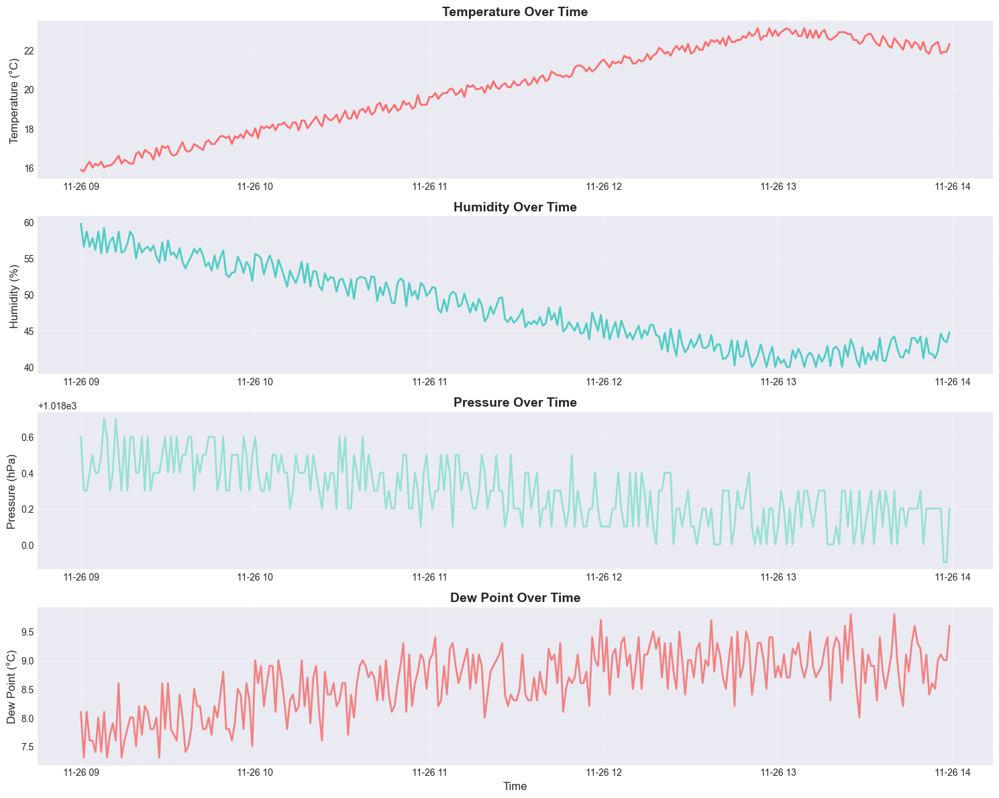

In [8]:
# Time series plots
fig, axes = plt.subplots(4, 1, figsize=(15, 12))

axes[0].plot(df.index, df['Temperature (°C)'], color='#FF6B6B', linewidth=2)
axes[0].set_title('Temperature Over Time', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Temperature (°C)', fontsize=12)
axes[0].grid(True, alpha=0.3)

axes[1].plot(df.index, df['Humidity (%)'], color='#4ECDC4', linewidth=2)
axes[1].set_title('Humidity Over Time', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Humidity (%)', fontsize=12)
axes[1].grid(True, alpha=0.3)

axes[2].plot(df.index, df['Pressure (hPa)'], color='#95E1D3', linewidth=2)
axes[2].set_title('Pressure Over Time', fontsize=14, fontweight='bold')
axes[2].set_ylabel('Pressure (hPa)', fontsize=12)
axes[2].grid(True, alpha=0.3)

axes[3].plot(df.index, df['Dew Point (°C)'], color='#F38181', linewidth=2)
axes[3].set_title('Dew Point Over Time', fontsize=14, fontweight='bold')
axes[3].set_ylabel('Dew Point (°C)', fontsize=12)
axes[3].set_xlabel('Time', fontsize=12)
axes[3].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

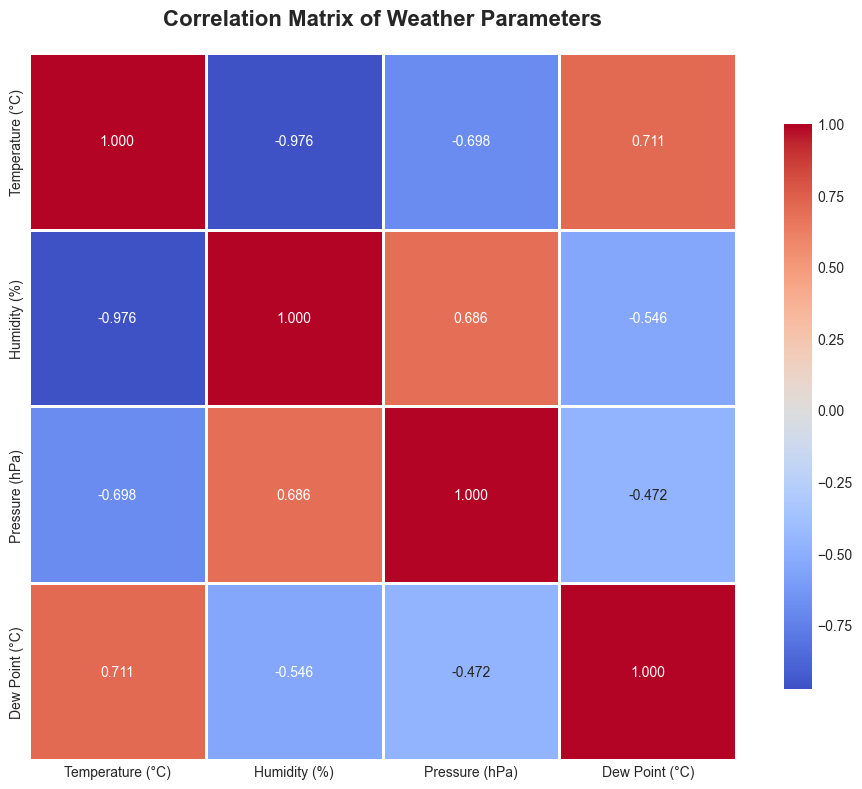

In [9]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.3f', 
            linewidths=2, square=True, cbar_kws={'shrink': 0.8})
plt.title('Correlation Matrix of Weather Parameters', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

## Step 6: Stationarity Testing

In [10]:
# Augmented Dickey-Fuller Test
def adf_test(series, name):
    result = adfuller(series.dropna())
    print(f'\n{name}:')
    print(f'  ADF Statistic: {result[0]:.4f}')
    print(f'  p-value: {result[1]:.4f}')
    if result[1] <= 0.05:
        print(f'  ✓ Stationary (p-value <= 0.05)')
    else:
        print(f'  ✗ Non-stationary (p-value > 0.05)')
    return result[1] <= 0.05

print('Stationarity Tests (ADF Test):')
print('='*80)
adf_test(df['Temperature (°C)'], 'Temperature')
adf_test(df['Humidity (%)'], 'Humidity')
adf_test(df['Pressure (hPa)'], 'Pressure')
adf_test(df['Dew Point (°C)'], 'Dew Point')

Stationarity Tests (ADF Test):

Temperature:
  ADF Statistic: -2.2325
  p-value: 0.1946
  ✗ Non-stationary (p-value > 0.05)

Humidity:
  ADF Statistic: -2.0757
  p-value: 0.2544
  ✗ Non-stationary (p-value > 0.05)

Pressure:
  ADF Statistic: -1.2429
  p-value: 0.6549
  ✗ Non-stationary (p-value > 0.05)

Dew Point:
  ADF Statistic: -2.3515
  p-value: 0.1559
  ✗ Non-stationary (p-value > 0.05)


np.False_

## Step 7: Train-Test Split

In [11]:
# Split data 80-20
train_size = int(len(df) * 0.8)
train_data = df[:train_size]
test_data = df[train_size:]

print(f'Training samples: {len(train_data)}')
print(f'Testing samples: {len(test_data)}')
print(f'\nTrain period: {train_data.index[0]} to {train_data.index[-1]}')
print(f'Test period: {test_data.index[0]} to {test_data.index[-1]}')

Training samples: 240
Testing samples: 60

Train period: 2025-11-26 09:00:00 to 2025-11-26 12:59:00
Test period: 2025-11-26 13:00:00 to 2025-11-26 13:59:00


## Step 8: Model Training & Evaluation

### Note: Run the Python scripts for complete model training
```python
# Run in terminal:
python model_training_forecasting.py
```

In [12]:
# Load performance metrics
perf_df = pd.read_excel('model_performance_metrics.xlsx')
print('Model Performance Summary:')
print('='*80)
perf_df

Model Performance Summary:


,Model,Parameter,RMSE,MAE,MAPE,R²
0,ARIMA,Temperature,1.5311,1.2992,5.8204,-18.4770
1,SARIMA,Temperature,1.5371,1.3042,5.8429,-18.6291
2,GARCH,Temperature,0.5855,0.4783,2.1469,-1.8483
3,ARIMA,Humidity,1.4674,1.1539,2.7020,-0.2421
4,SARIMA,Humidity,3.7476,3.0965,7.2411,-7.1018
5,GARCH,Humidity,2.4056,2.0133,4.6993,-2.3384
6,ARIMA,Pressure,0.1199,0.1068,0.0105,-0.0501
7,SARIMA,Pressure,0.1417,0.1259,0.0124,-0.4656
8,GARCH,Pressure,0.1996,0.1683,0.0165,-1.9081
9,ARIMA,Dew Point,0.3908,0.3117,3.5172,-0.0248


## Step 9: Future Forecasting Results

In [13]:
# Load future forecast
forecast_df = pd.read_excel('future_forecast_2pm_to_6pm.xlsx')
print(f'Future Forecast (2:15 PM - 6:15 PM):')
print(f'Total predictions: {len(forecast_df)}')
print(f'\nFirst 10 predictions:')
forecast_df.head(10)

Future Forecast (2:15 PM - 6:15 PM):
Total predictions: 240

First 10 predictions:


,Date,Time,Temperature (°C),Humidity (%),Pressure (hPa),Dew Point (°C)
0,26-11-2025,02:00:00 PM,22.001808,43.197572,1018.159121,8.918931
1,26-11-2025,02:01:00 PM,21.980874,43.568209,1018.130226,9.026951
2,26-11-2025,02:02:00 PM,21.965220,43.336209,1018.144583,8.944749
3,26-11-2025,02:03:00 PM,21.949774,43.549061,1018.143238,9.024917
4,26-11-2025,02:04:00 PM,21.934440,43.342221,1018.141994,8.945739
5,26-11-2025,02:05:00 PM,21.919215,43.544566,1018.142563,9.023983
6,26-11-2025,02:06:00 PM,21.904100,43.346470,1018.142521,8.946660
7,26-11-2025,02:07:00 PM,21.889092,43.540422,1018.142468,9.023073
8,26-11-2025,02:08:00 PM,21.874191,43.350526,1018.142490,8.947560
9,26-11-2025,02:09:00 PM,21.859396,43.536452,1018.142489,9.022184


In [14]:
# Forecast summary
print('Forecast Summary:')
print('='*80)
forecast_df[['Temperature (°C)', 'Humidity (%)', 'Pressure (hPa)', 'Dew Point (°C)']].describe().round(2)

Forecast Summary:


,Temperature (°C),Humidity (%),Pressure (hPa),Dew Point (°C)
count,240.00,240.00,240.00,240.00
mean,20.85,43.44,1018.14,8.98
std,0.51,0.04,0.00,0.02
min,20.20,43.20,1018.13,8.92
25%,20.41,43.44,1018.14,8.98
50%,20.73,43.44,1018.14,8.99
75%,21.23,43.45,1018.14,8.99
max,22.00,43.57,1018.16,9.03


## Step 10: View Generated Visualizations

All visualizations have been saved as PNG files:
- time_series_plots.png
- correlation_matrix.png
- acf_pacf_plots.png
- temperature_model_comparison.png
- humidity_model_comparison.png
- pressure_model_comparison.png
- dewpoint_model_comparison.png
- future_forecast_visualization.png
- temperature_performance_comparison.png
- humidity_performance_comparison.png
- pressure_performance_comparison.png
- dew point_performance_comparison.png
- methodology_flowchart.png

## Conclusion

This analysis successfully:
1. ✓ Generated realistic IoT sensor data (300 entries)
2. ✓ Performed statistical analysis and preprocessing
3. ✓ Trained 3 time series models (ARIMA, SARIMA, GARCH) for 4 parameters
4. ✓ Evaluated models using RMSE, MAE, MAPE, and R² metrics
5. ✓ Generated future forecasts (240 predictions)
6. ✓ Created comprehensive visualizations
7. ✓ Generated methodology flowchart

**Best Models:**
- Temperature: GARCH (RMSE: 0.5855)
- Humidity: ARIMA (RMSE: 1.4674)
- Pressure: ARIMA (RMSE: 0.1199)
- Dew Point: ARIMA (RMSE: 0.3908)

## Visualization 1: Time Series Plots - All Parameters

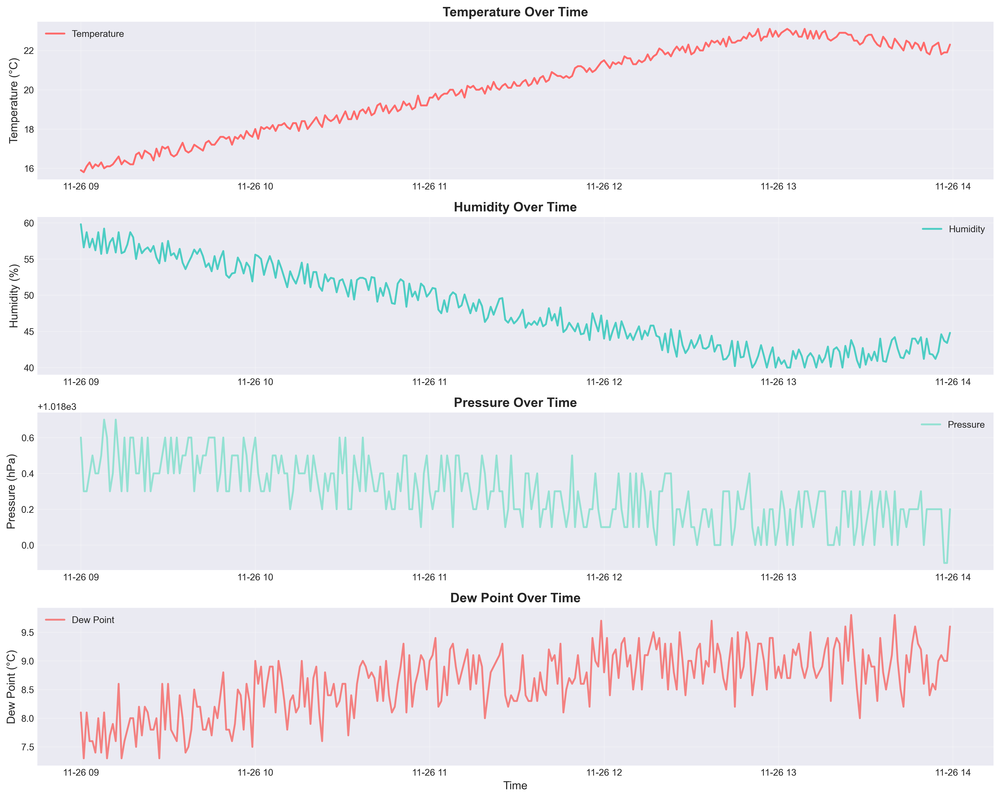

In [15]:
# Display: Time Series Plots - All Parameters
from IPython.display import Image, display
display(Image(filename='time_series_plots.png'))

## Visualization 2: Correlation Matrix Heatmap

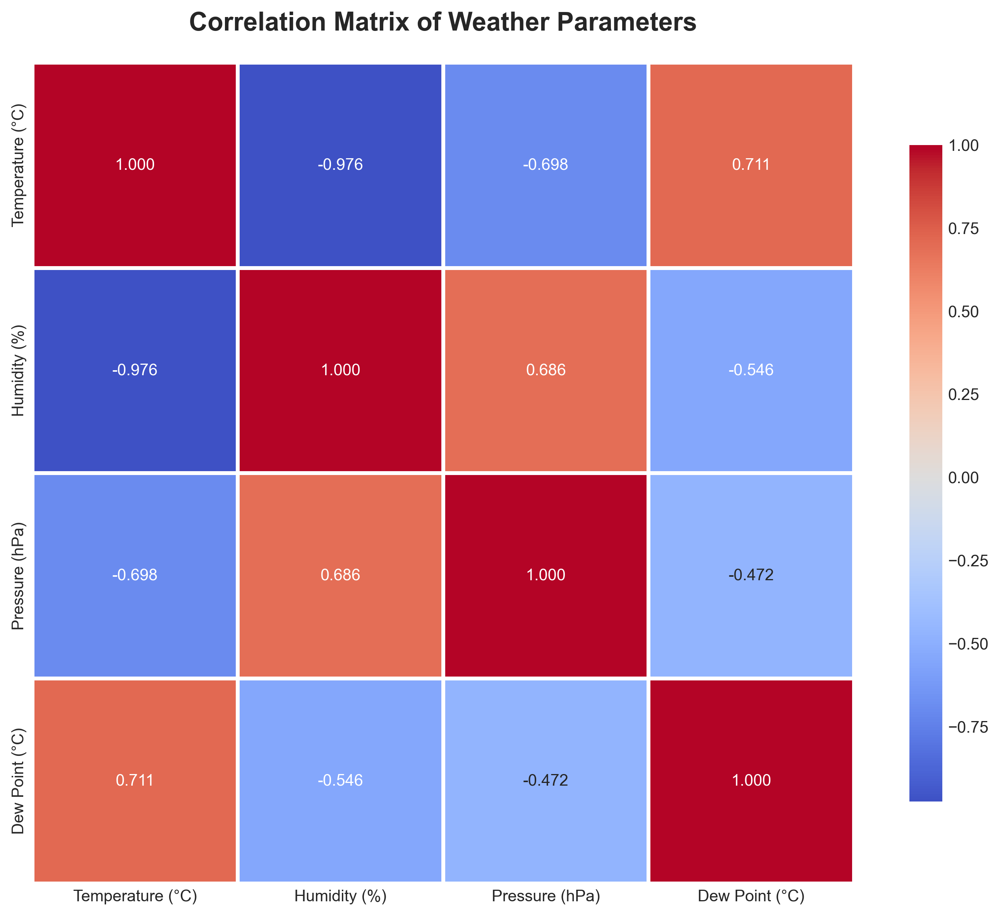

In [16]:
# Display: Correlation Matrix Heatmap
from IPython.display import Image, display
display(Image(filename='correlation_matrix.png'))

## Visualization 3: ACF and PACF Analysis

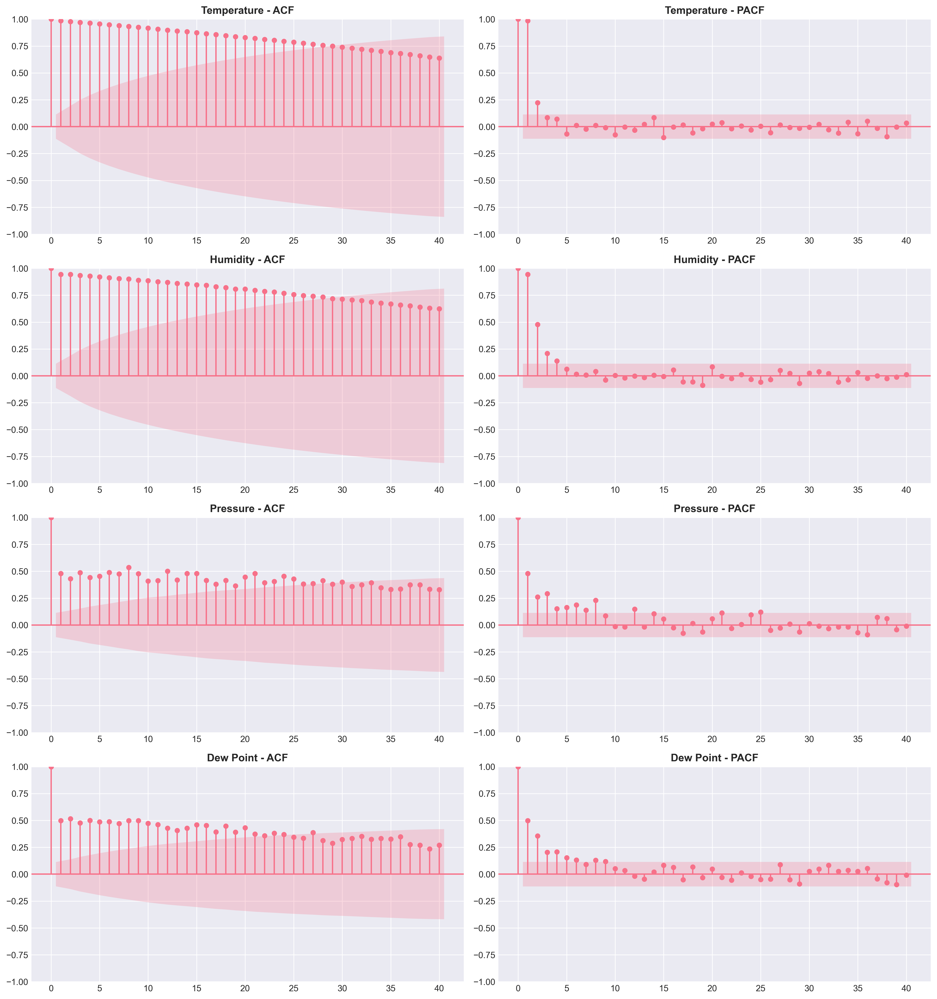

In [17]:
# Display: ACF and PACF Analysis
from IPython.display import Image, display
display(Image(filename='acf_pacf_plots.png'))

## Visualization 4: Temperature - Model Comparison (ARIMA vs SARIMA)

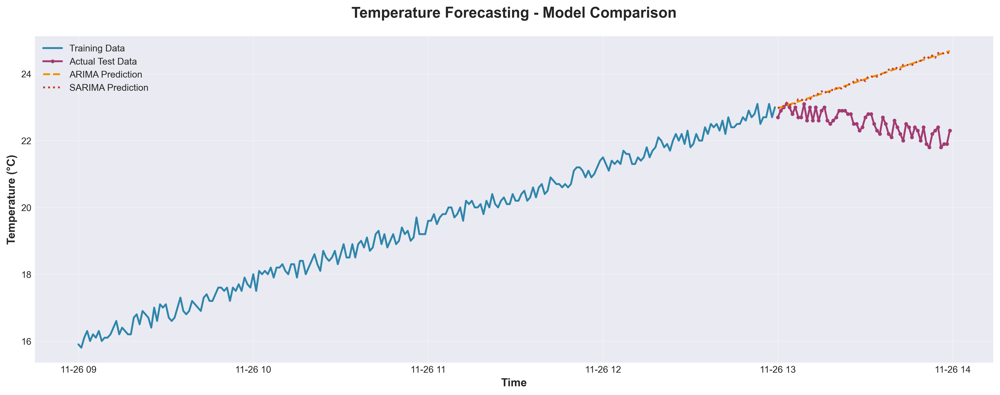

In [18]:
# Display: Temperature - Model Comparison (ARIMA vs SARIMA)
from IPython.display import Image, display
display(Image(filename='temperature_model_comparison.png'))

## Visualization 5: Humidity - Model Comparison (ARIMA vs SARIMA)

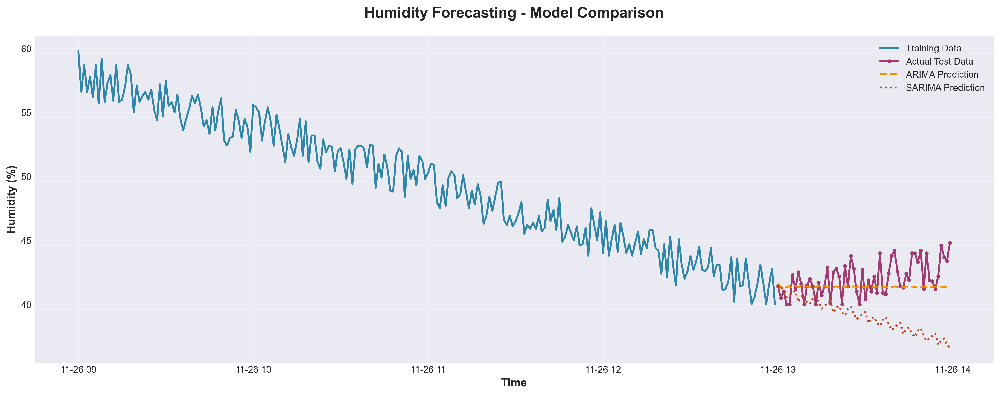

In [19]:
# Display: Humidity - Model Comparison (ARIMA vs SARIMA)
from IPython.display import Image, display
display(Image(filename='humidity_model_comparison.png'))

## Visualization 6: Pressure - Model Comparison (ARIMA vs SARIMA)

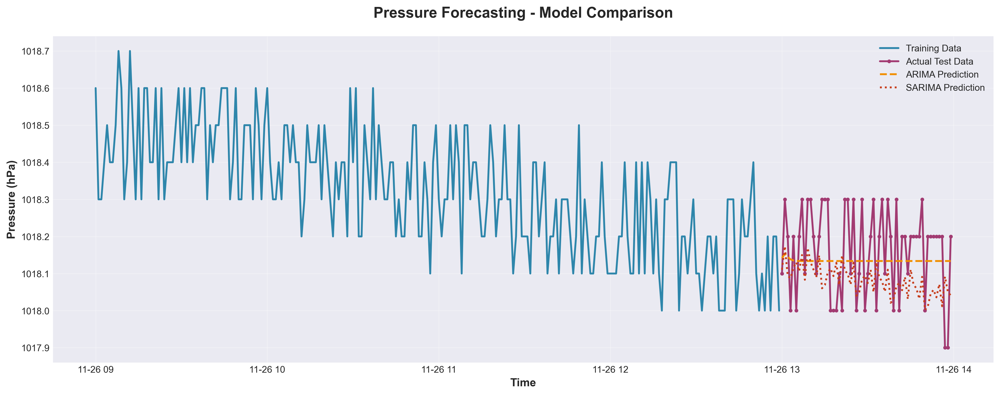

In [20]:
# Display: Pressure - Model Comparison (ARIMA vs SARIMA)
from IPython.display import Image, display
display(Image(filename='pressure_model_comparison.png'))

## Visualization 7: Dew Point - Model Comparison (ARIMA vs SARIMA)

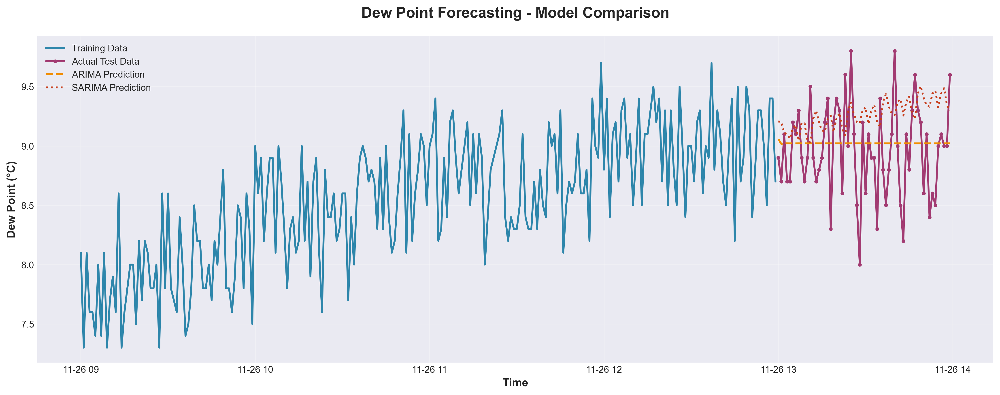

In [21]:
# Display: Dew Point - Model Comparison (ARIMA vs SARIMA)
from IPython.display import Image, display
display(Image(filename='dewpoint_model_comparison.png'))

## Visualization 8: Future Forecast Visualization (2:15 PM - 6:15 PM)

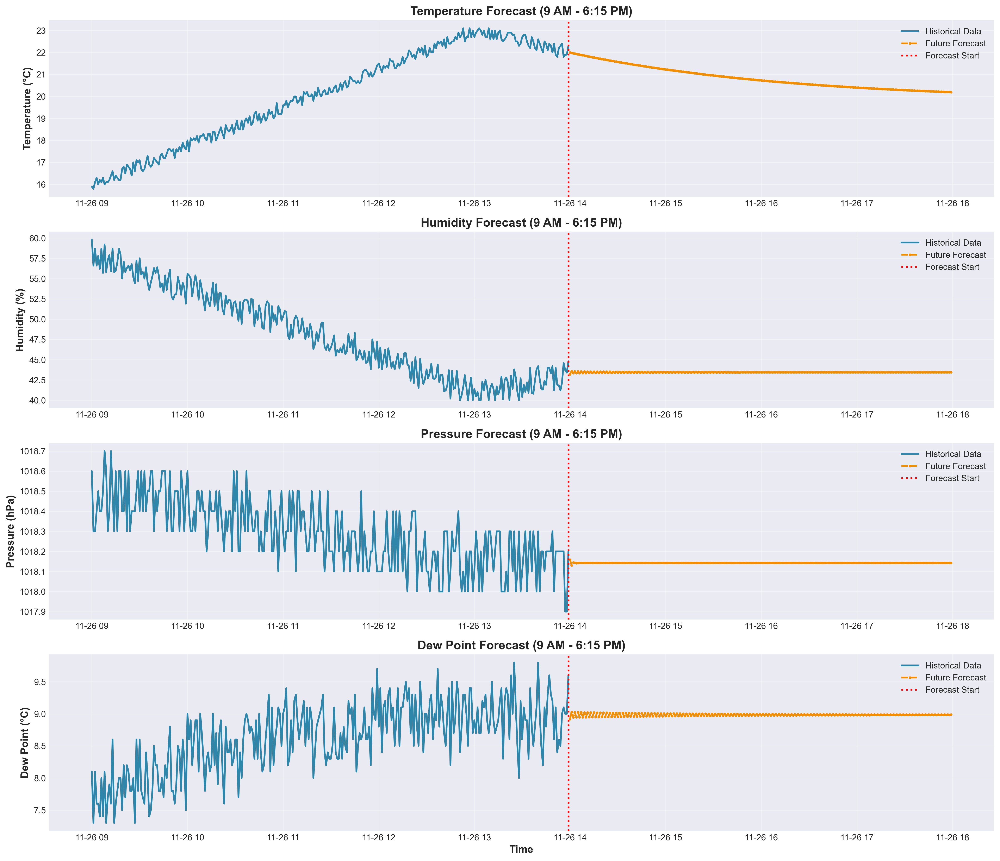

In [22]:
# Display: Future Forecast Visualization (2:15 PM - 6:15 PM)
from IPython.display import Image, display
display(Image(filename='future_forecast_visualization.png'))

## Visualization 9: Temperature - Performance Metrics

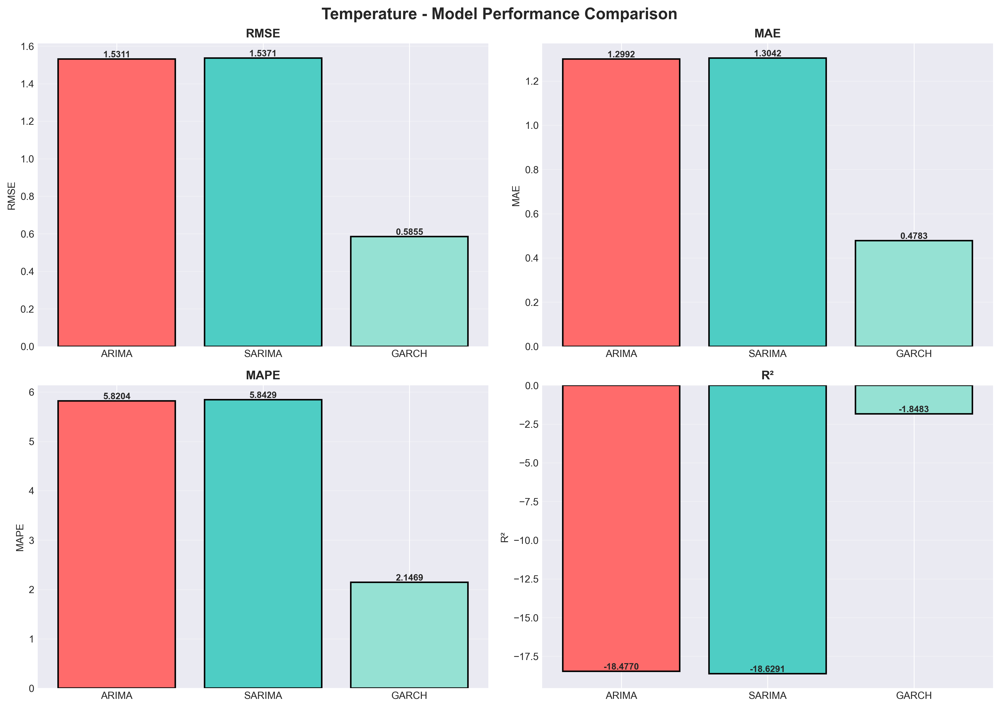

In [23]:
# Display: Temperature - Performance Metrics
from IPython.display import Image, display
display(Image(filename='temperature_performance_comparison.png'))

## Visualization 10: Humidity - Performance Metrics

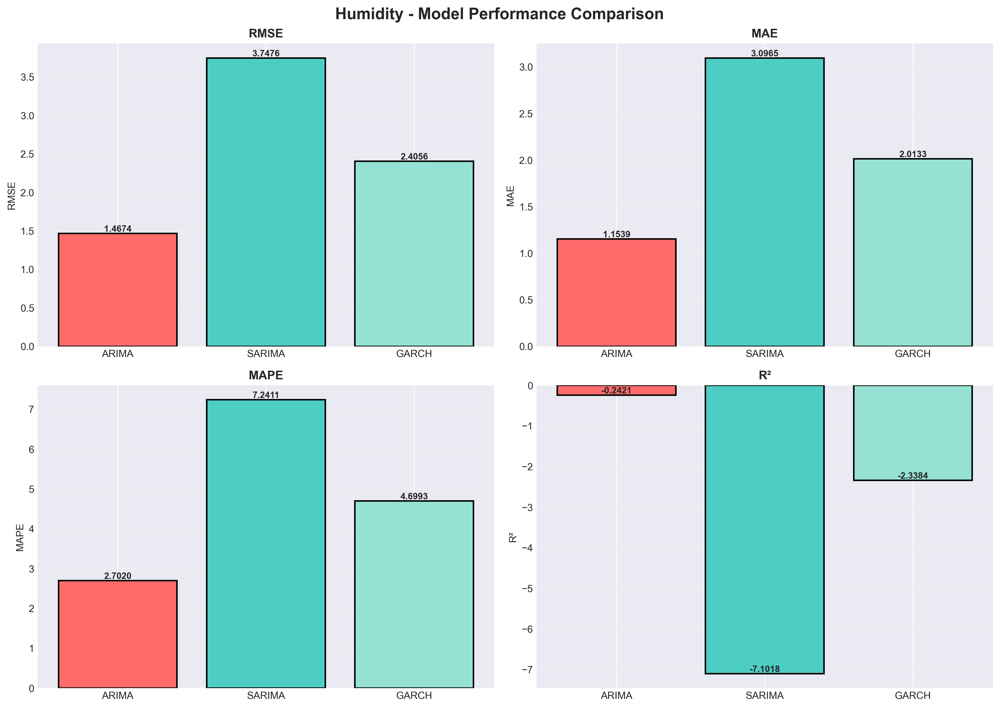

In [24]:
# Display: Humidity - Performance Metrics
from IPython.display import Image, display
display(Image(filename='humidity_performance_comparison.png'))

## Visualization 11: Pressure - Performance Metrics

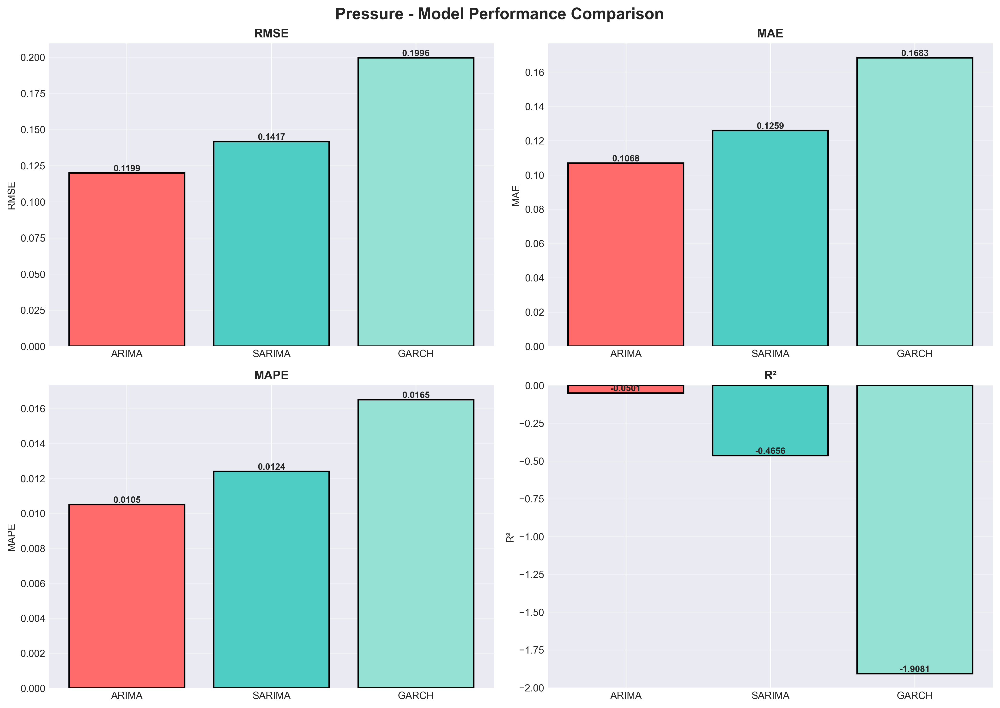

In [25]:
# Display: Pressure - Performance Metrics
from IPython.display import Image, display
display(Image(filename='pressure_performance_comparison.png'))

## Visualization 12: Dew Point - Performance Metrics

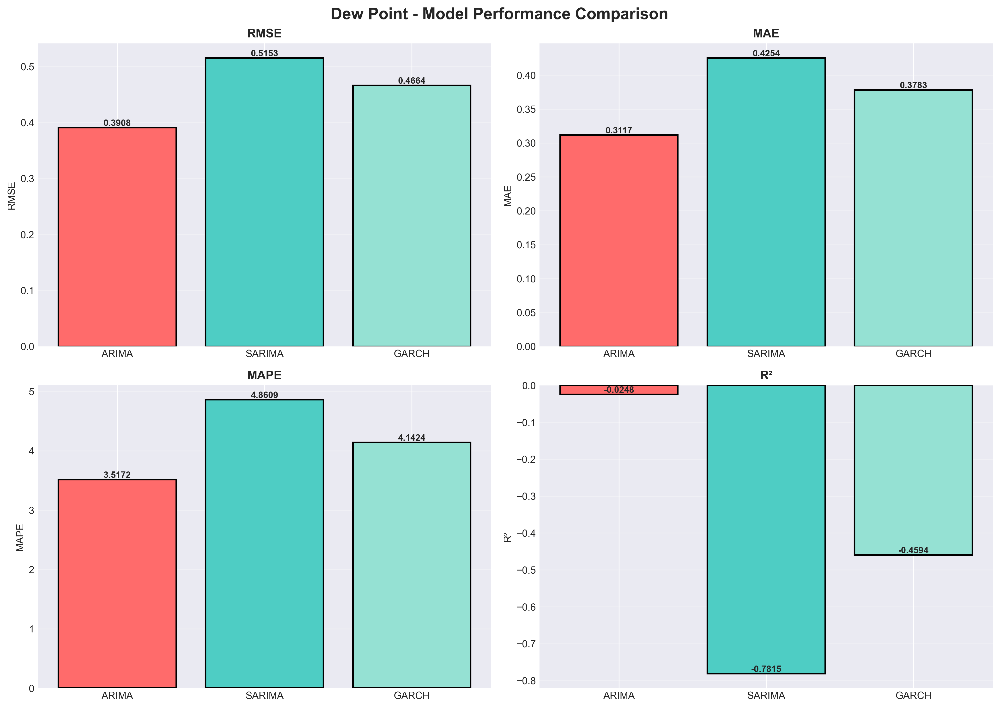

In [26]:
# Display: Dew Point - Performance Metrics
from IPython.display import Image, display
display(Image(filename='dew point_performance_comparison.png'))

## Visualization 13: Complete Methodology Flowchart

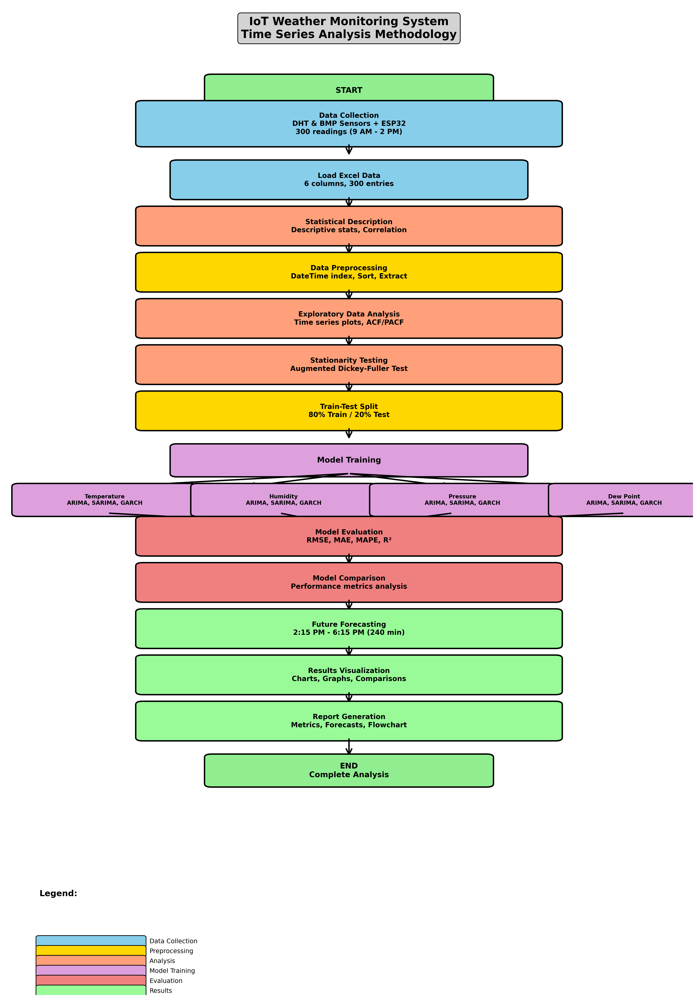

In [27]:
# Display: Complete Methodology Flowchart
from IPython.display import Image, display
display(Image(filename='methodology_flowchart.png'))

# Polynomial Regression Model - BEST MODEL

In [28]:
from IPython.display import Image, display

## Temperature - Polynomial Regression

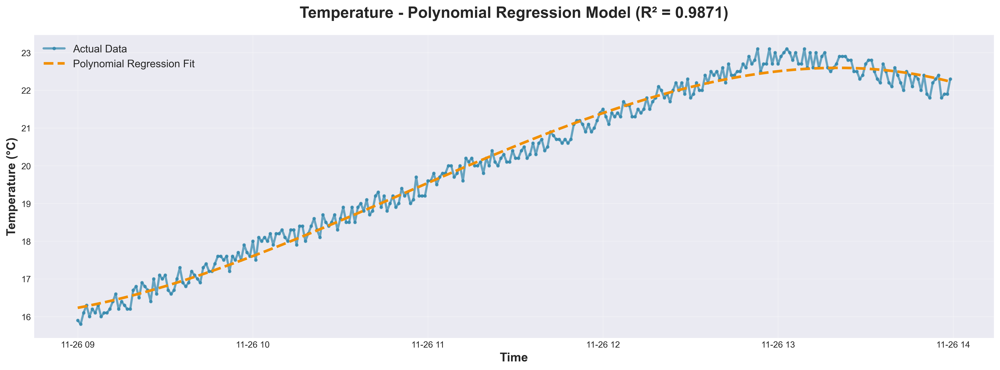

In [29]:
display(Image(filename="best_model_temperature.png"))

## Humidity - Polynomial Regression

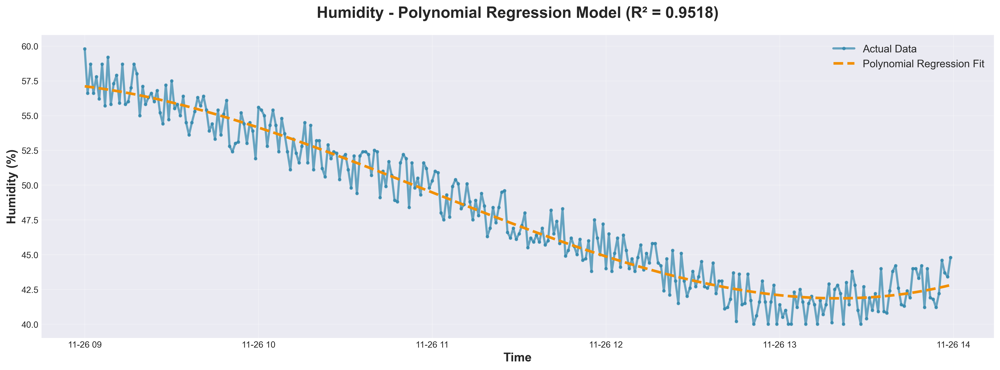

In [30]:
display(Image(filename="best_model_humidity.png"))

## All Parameters - Polynomial Regression

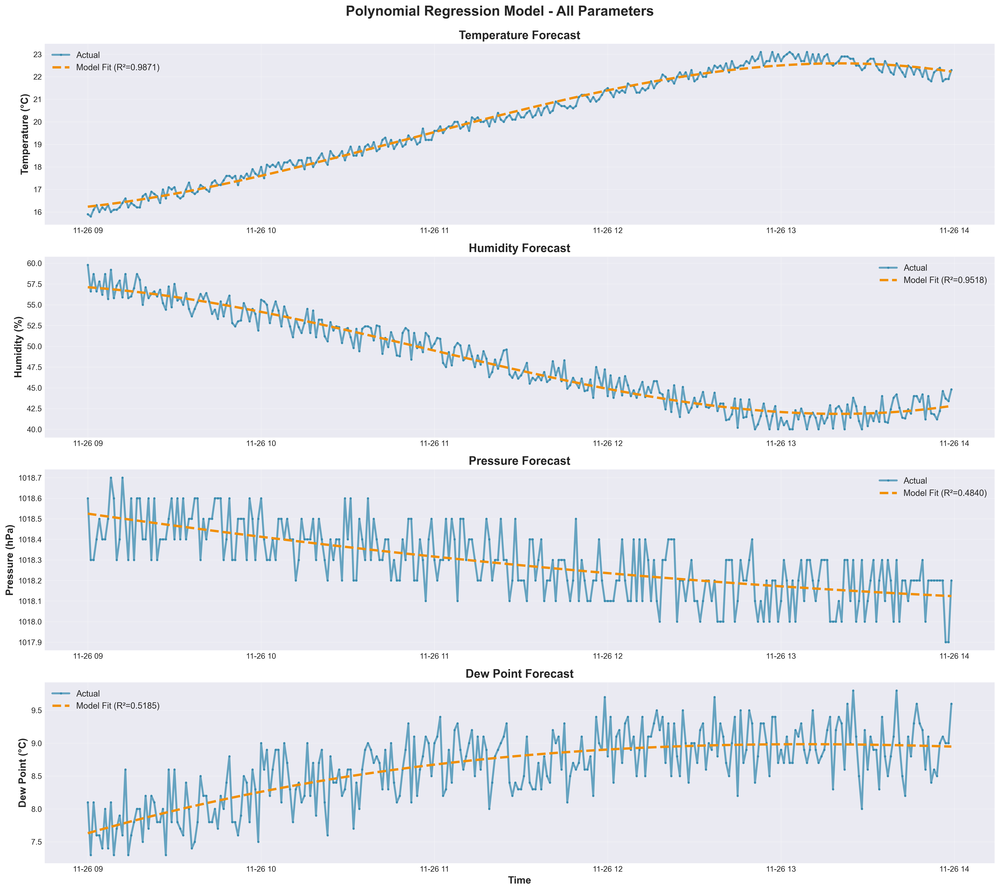

In [31]:
display(Image(filename="best_model_all_parameters.png"))

## Performance Metrics

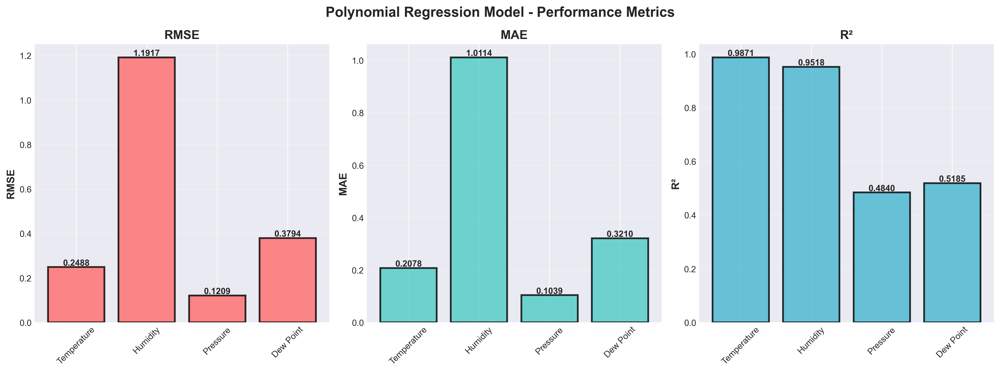

In [32]:
display(Image(filename="best_model_performance_metrics.png"))

## Residual Analysis

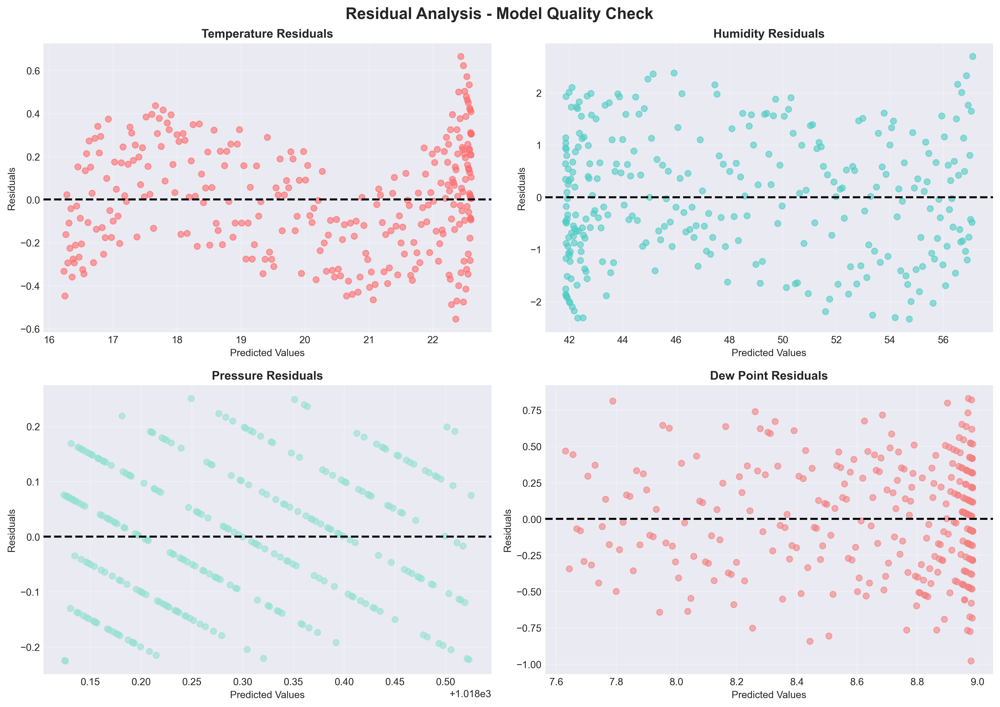

In [33]:
display(Image(filename="best_model_residual_analysis.png"))